[![Roboflow Notebooks](https://media.roboflow.com/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

[![Roboflow](https://raw.githubusercontent.com/roboflow-ai/notebooks/main/assets/badges/roboflow-blogpost.svg)](https://blog.roboflow.com/how-to-train-yolov8-on-a-custom-dataset)
[![YouTube](https://badges.aleen42.com/src/youtube.svg)](https://youtu.be/wuZtUMEiKWY)
[![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/ultralytics/ultralytics)


In this tutorial, we are going to cover:

- Before you start
- Install YOLOv8
- CLI Basics
- Inference with Pre-trained COCO Model
- Roboflow Universe
- Preparing a custom dataset
- Custom Training
- Validate Custom Model
- Inference with Custom Model

## Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [1]:
!nvidia-smi

Mon Apr 29 12:05:01 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.129.03             Driver Version: 535.129.03   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/kaggle/working


## YOLOv8

In [3]:
# Pip install method (recommended)

!pip install ultralytics==8.0.196

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5597.6/8062.4 GB disk)


In [4]:
from ultralytics import YOLO

from IPython.display import display, Image

In [5]:
from kaggle_secrets import UserSecretsClient
user_secrets = UserSecretsClient()
api_key = user_secrets.get_secret("ROBOFLOW_API_KEY")

In [6]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key=api_key)
project = rf.workspace("tahiradefne").project("swan_detect_project")
version = project.version(1)
dataset = version.download("yolov8")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.6/74.6 kB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 24.3 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
  Attempting uninstall: idna
    Found existing installation: idna 3.6
    Uninstalling idna-3.6:
      Successfully uninstalled idna-3.6
  Attempting uninstall: cycler
    Found existing installation: cycler 0.12.1
    Uninstalling cycler-0.12.1:
      Successfully uninstalled cycler-0.12.1
  Attempting uninstall: certifi
    Found existing installation: certifi 2024.2.2
    U


Extracting Dataset Version Zip to Swan_Detect_Project-1 in yolov8:: 100%|██████████| 1808/1808 [00:00<00:00, 9581.17it/s]


## Custom Training

In [7]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data=/kaggle/input/swan-dataset/data.yaml epochs=200 imgsz=320 plots=True

/kaggle/working
100%|███████████████████████████████████████| 21.5M/21.5M [00:00<00:00, 163MB/s]
New https://pypi.org/project/ultralytics/8.2.5 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/kaggle/input/swan-dataset/data.yaml, epochs=200, patience=50, batch=16, imgsz=320, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, sh

In [8]:
!ls {HOME}/runs/detect/train/

F1_curve.png					  train_batch0.jpg
PR_curve.png					  train_batch1.jpg
P_curve.png					  train_batch2.jpg
R_curve.png					  train_batch9500.jpg
args.yaml					  train_batch9501.jpg
confusion_matrix.png				  train_batch9502.jpg
confusion_matrix_normalized.png			  val_batch0_labels.jpg
events.out.tfevents.1714392373.fc804a99fea6.70.0  val_batch0_pred.jpg
labels.jpg					  val_batch1_labels.jpg
labels_correlogram.jpg				  val_batch1_pred.jpg
results.csv					  weights
results.png


/kaggle/working


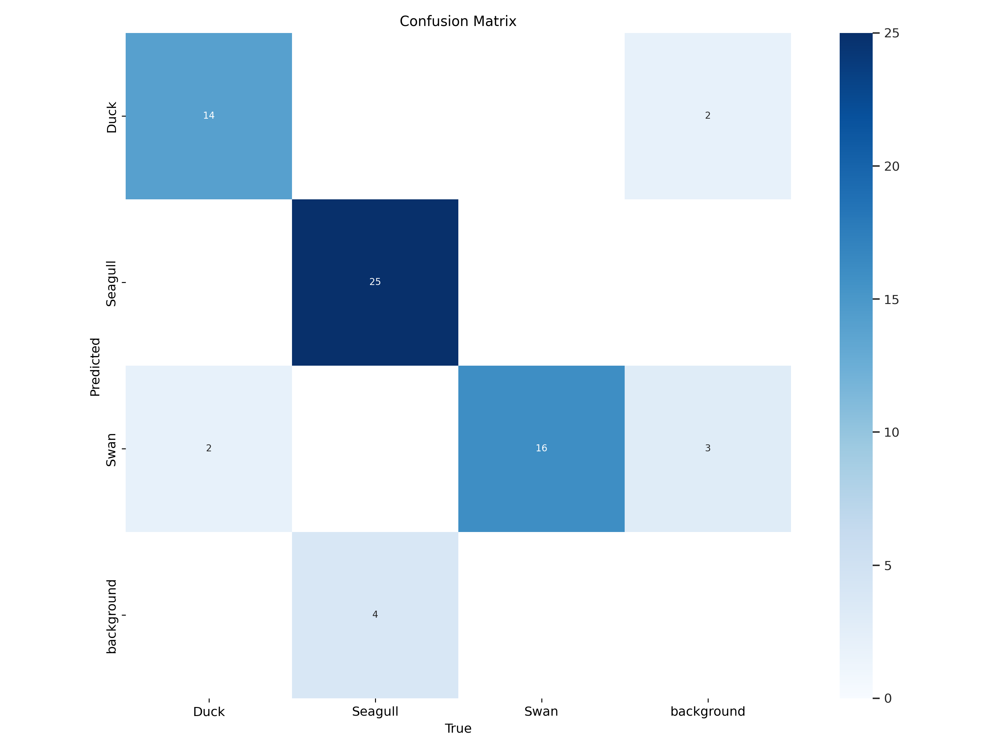

In [9]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

/kaggle/working


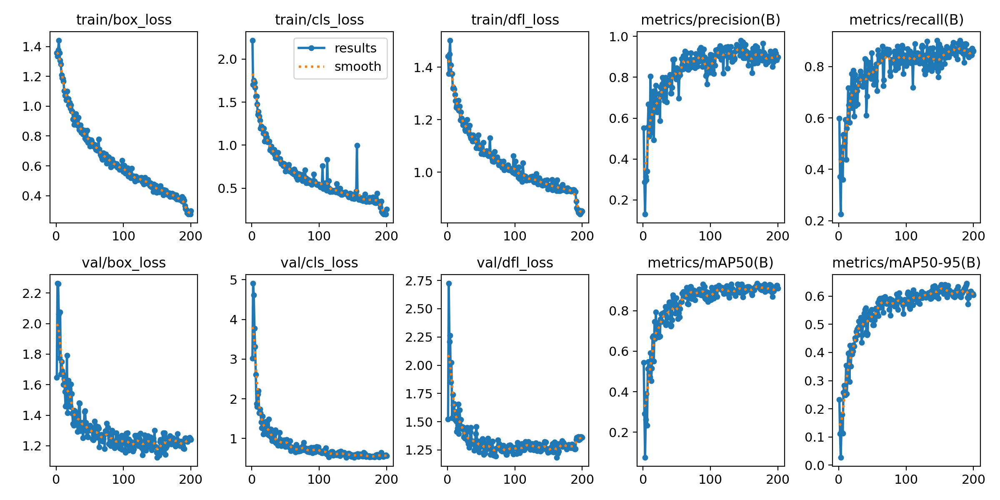

In [10]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

/kaggle/working


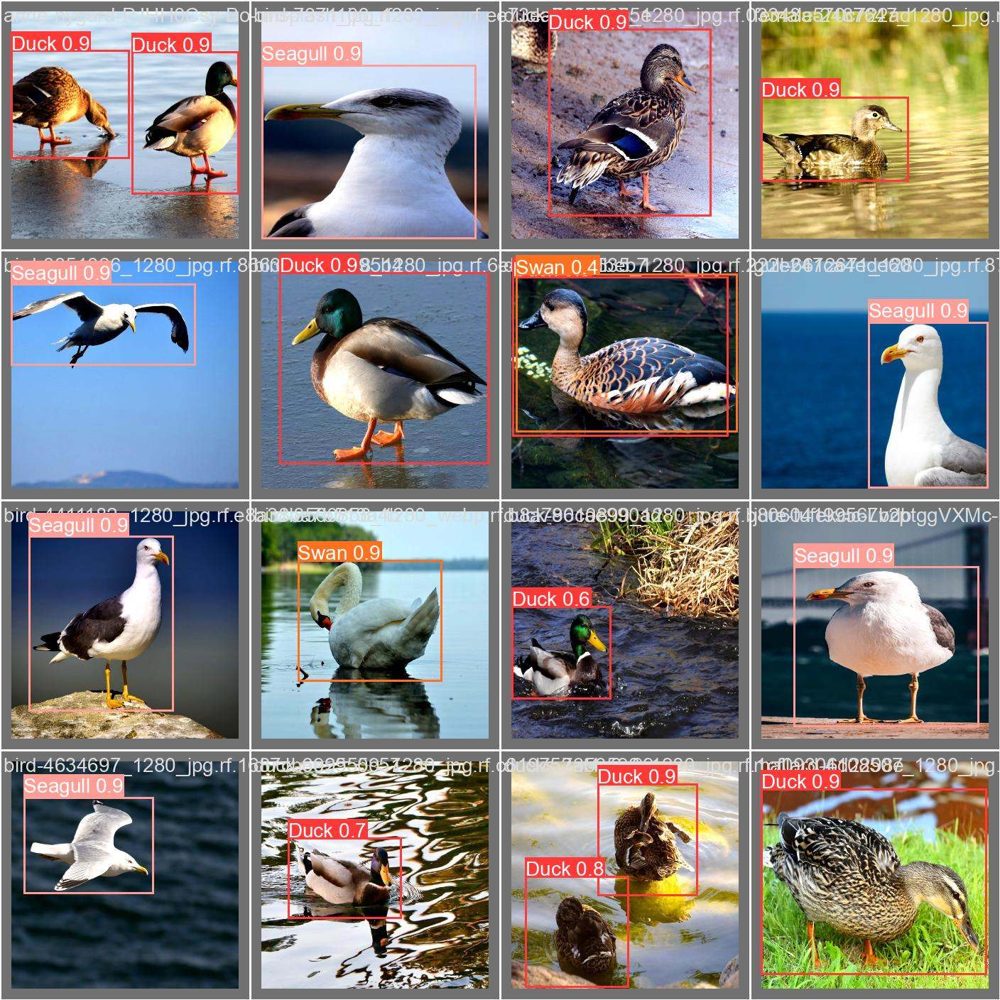

In [11]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=600)

/kaggle/working


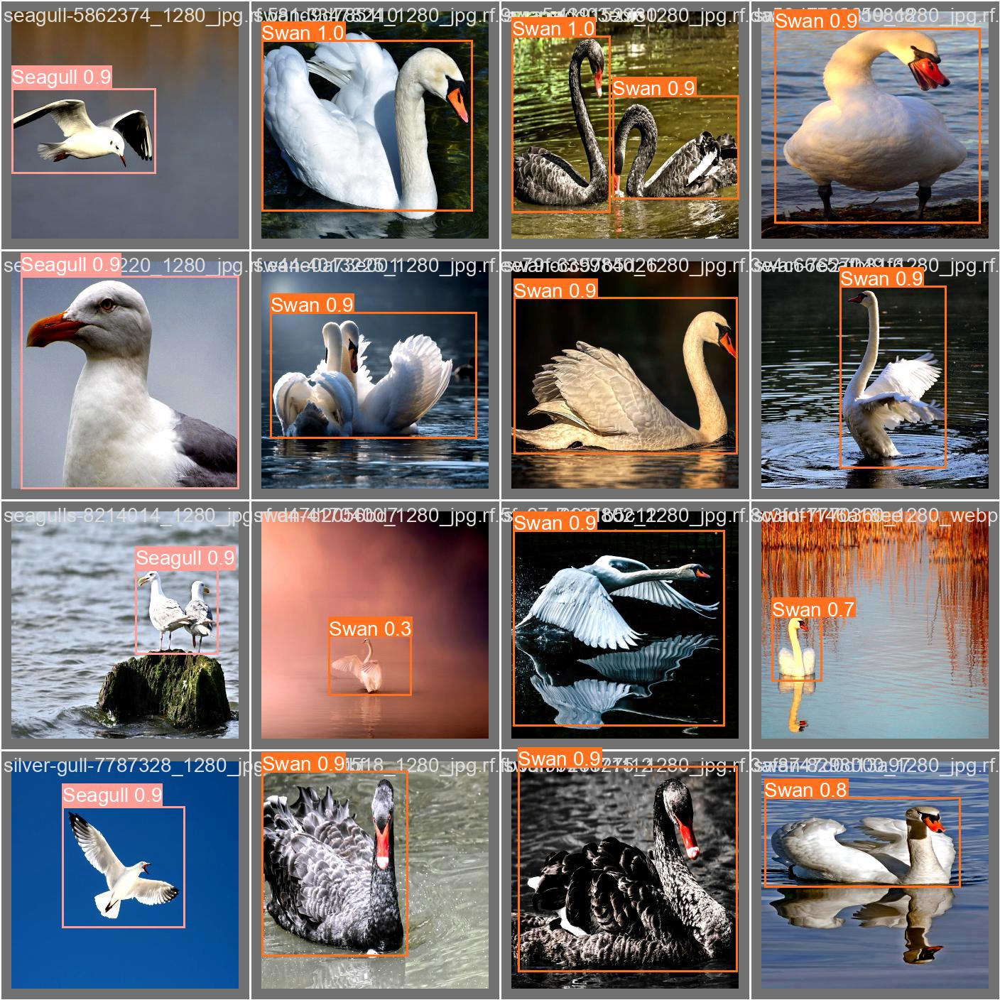

In [12]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch1_pred.jpg', width=600)

## Validate Custom Model

In [13]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

/kaggle/working
Ultralytics YOLOv8.0.196 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126745 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /kaggle/working/Swan_Detect_Project-1/valid/labels... 50 images, 0
val: New cache created: /kaggle/working/Swan_Detect_Project-1/valid/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all         50         61      0.911      0.862      0.923      0.645
                  Duck         50         16      0.931      0.875      0.955      0.549
               Seagull         50         29          1      0.835      0.902      0.667
                  Swan         50         16      0.803      0.875      0.911      0.719
Speed: 1.4ms preprocess, 20.1ms inference, 0.0ms loss, 23.8ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


## Inference with Custom Model

In [14]:
%cd {HOME}
!yolo task=detect mode=predict model=/kaggle/working/runs/detect/train/weights/best.pt conf=0.25 source=/kaggle/input/swan-dataset/test/images

/kaggle/working
Ultralytics YOLOv8.0.196 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126745 parameters, 0 gradients, 28.4 GFLOPs

WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/63 /kaggle/input/swan-dataset/test/images/bird-7681238_1280_jpg.rf.c9fa5f37aa30999e6b3c6034e1a16c9f.jpg: 320x320 1 Swan, 8.2ms
image 2/63 /kaggle/input/swan-dataset/test/images/birds-5142796_1280_jpg.rf.eaf37d233cdb3883d96b34e0f8ce4928.jpg: 320x320 1 Duck, 6 Swans, 8.2ms
image 3/63 /kaggle/input/swan-dataset/test/images/cameron-witney-zRhnklVaSSg-unsplash_jpg.rf.9b9b2bd77833168cded5b0b239037453.jpg: 320x320 1 Seagull, 8.0ms
image 4/63 /kaggle/input/swan-dataset/test/images/claudio-mezzasalma-f3AUDnrPxlM-unsplash_jpg.rf.1b6ef0ff251d565c5987d393757b7c02.jpg: 320x320 1 Seagull, 8.0ms
image 5/63 /kaggle/input/swan-dataset/test/images/coscoroba-swan-7475632_1280_jpg.rf.471faf756c1ba3dc83b9114cafcb4c88.jpg: 320x320 1 Swan, 8.0ms
image 6/63 /kaggle/input/swan-dataset

# Predictions

In [15]:
%cd {HOME}
!yolo task=detect mode=predict model=/kaggle/working/runs/detect/train/weights/best.pt conf=0.25 source=/kaggle/input/video-swan/31264-385265648_small.mp4

/kaggle/working
Ultralytics YOLOv8.0.196 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126745 parameters, 0 gradients, 28.4 GFLOPs

video 1/1 (1/1476) /kaggle/input/video-swan/31264-385265648_small.mp4: 192x320 1 Duck, 1 Swan, 86.4ms
video 1/1 (2/1476) /kaggle/input/video-swan/31264-385265648_small.mp4: 192x320 1 Duck, 1 Swan, 8.7ms
video 1/1 (3/1476) /kaggle/input/video-swan/31264-385265648_small.mp4: 192x320 1 Duck, 1 Swan, 7.1ms
video 1/1 (4/1476) /kaggle/input/video-swan/31264-385265648_small.mp4: 192x320 1 Duck, 1 Swan, 7.1ms
video 1/1 (5/1476) /kaggle/input/video-swan/31264-385265648_small.mp4: 192x320 1 Duck, 1 Swan, 7.1ms
video 1/1 (6/1476) /kaggle/input/video-swan/31264-385265648_small.mp4: 192x320 1 Duck, 1 Seagull, 1 Swan, 7.0ms
video 1/1 (7/1476) /kaggle/input/video-swan/31264-385265648_small.mp4: 192x320 1 Duck, 1 Seagull, 1 Swan, 7.5ms
video 1/1 (8/1476) /kaggle/input/video-swan/31264-385265648_small.mp4: 192x320 1 Duck, 3 S

In [16]:
%cd {HOME}
!yolo task=detect mode=predict model=/kaggle/working/runs/detect/train/weights/best.pt conf=0.25 source=/kaggle/input/video-swan/1507868-uhd_3840_2160_25fps.mp4

/kaggle/working
Ultralytics YOLOv8.0.196 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126745 parameters, 0 gradients, 28.4 GFLOPs

WARNING ⚠️ NMS time limit 0.550s exceeded
video 1/1 (1/564) /kaggle/input/video-swan/1507868-uhd_3840_2160_25fps.mp4: 192x320 1 Duck, 3 Swans, 97.1ms
video 1/1 (2/564) /kaggle/input/video-swan/1507868-uhd_3840_2160_25fps.mp4: 192x320 1 Duck, 3 Swans, 11.1ms
video 1/1 (3/564) /kaggle/input/video-swan/1507868-uhd_3840_2160_25fps.mp4: 192x320 4 Swans, 7.4ms
video 1/1 (4/564) /kaggle/input/video-swan/1507868-uhd_3840_2160_25fps.mp4: 192x320 1 Duck, 4 Swans, 7.5ms
video 1/1 (5/564) /kaggle/input/video-swan/1507868-uhd_3840_2160_25fps.mp4: 192x320 4 Swans, 7.5ms
video 1/1 (6/564) /kaggle/input/video-swan/1507868-uhd_3840_2160_25fps.mp4: 192x320 5 Swans, 8.0ms
video 1/1 (7/564) /kaggle/input/video-swan/1507868-uhd_3840_2160_25fps.mp4: 192x320 5 Swans, 7.4ms
video 1/1 (8/564) /kaggle/input/video-swan/1507868-uhd_3840

In [17]:
%cd {HOME}
!yolo task=detect mode=predict model=/kaggle/working/runs/detect/train/weights/best.pt conf=0.25 source=/kaggle/input/video-swan/5932324-hd_1920_1080_24fps.mp4

/kaggle/working
Ultralytics YOLOv8.0.196 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126745 parameters, 0 gradients, 28.4 GFLOPs

WARNING ⚠️ NMS time limit 0.550s exceeded
video 1/1 (1/102) /kaggle/input/video-swan/5932324-hd_1920_1080_24fps.mp4: 192x320 2 Swans, 72.3ms
video 1/1 (2/102) /kaggle/input/video-swan/5932324-hd_1920_1080_24fps.mp4: 192x320 2 Swans, 7.4ms
video 1/1 (3/102) /kaggle/input/video-swan/5932324-hd_1920_1080_24fps.mp4: 192x320 1 Duck, 2 Swans, 10.4ms
video 1/1 (4/102) /kaggle/input/video-swan/5932324-hd_1920_1080_24fps.mp4: 192x320 4 Swans, 9.5ms
video 1/1 (5/102) /kaggle/input/video-swan/5932324-hd_1920_1080_24fps.mp4: 192x320 2 Swans, 7.4ms
video 1/1 (6/102) /kaggle/input/video-swan/5932324-hd_1920_1080_24fps.mp4: 192x320 2 Swans, 7.3ms
video 1/1 (7/102) /kaggle/input/video-swan/5932324-hd_1920_1080_24fps.mp4: 192x320 2 Swans, 7.3ms
video 1/1 (8/102) /kaggle/input/video-swan/5932324-hd_1920_1080_24fps.mp4: 192x320

**NOTE:** Let's take a look at few results.

In [18]:
!pip install opencv-python-headless

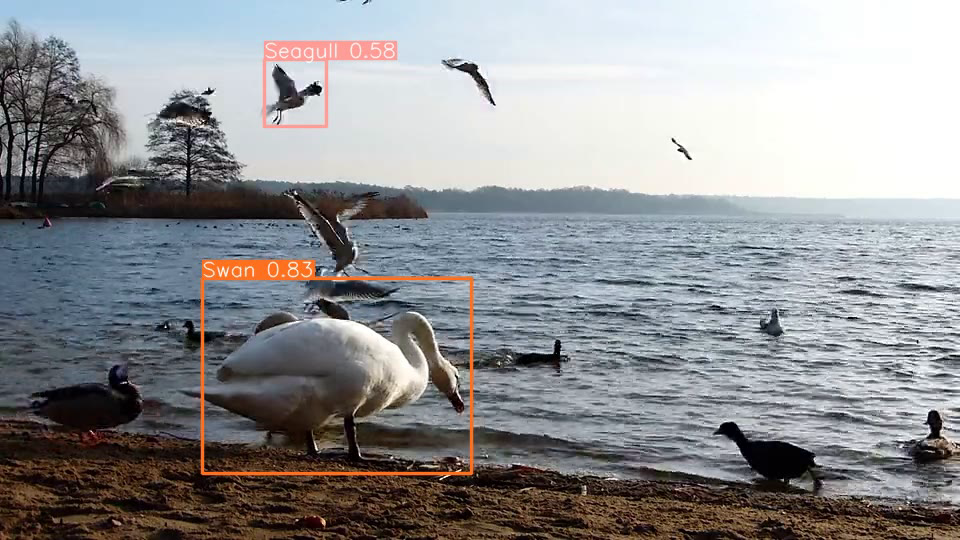

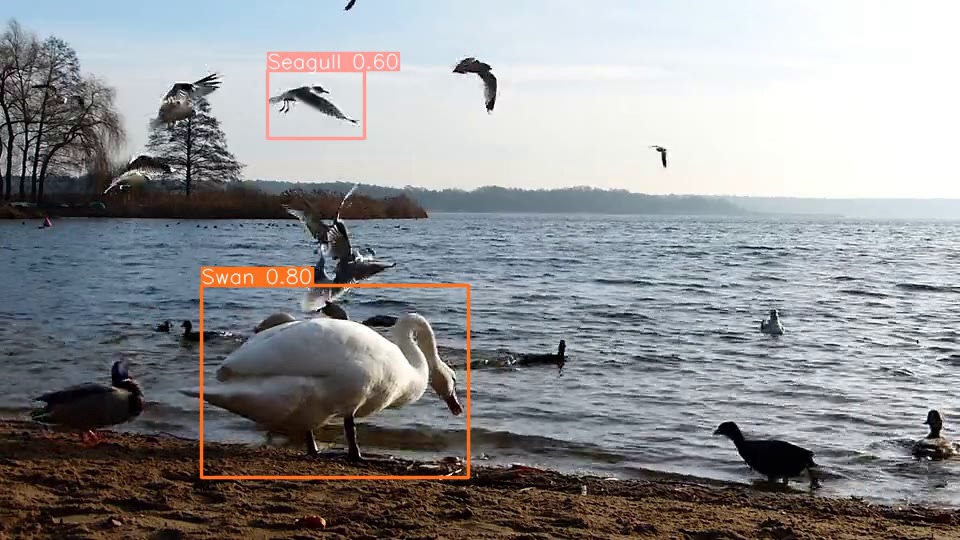

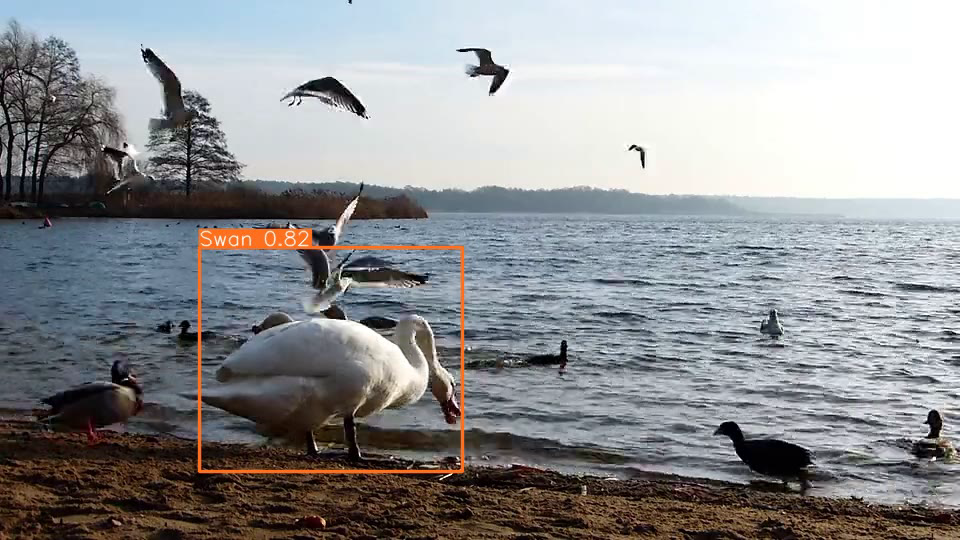

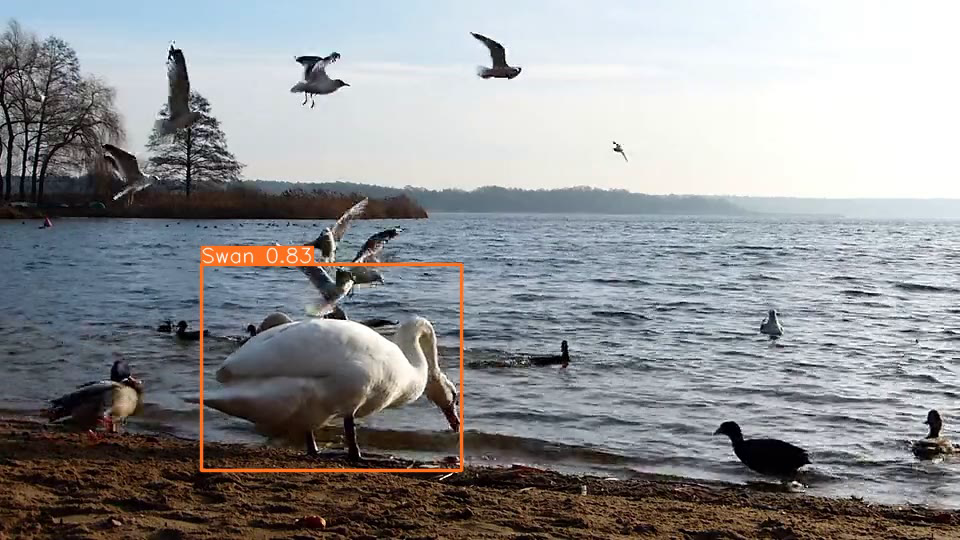

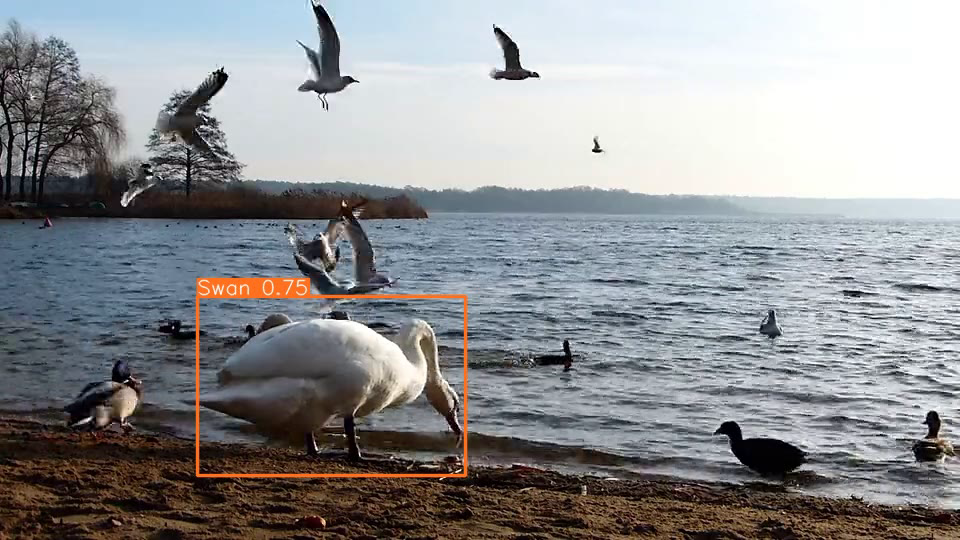

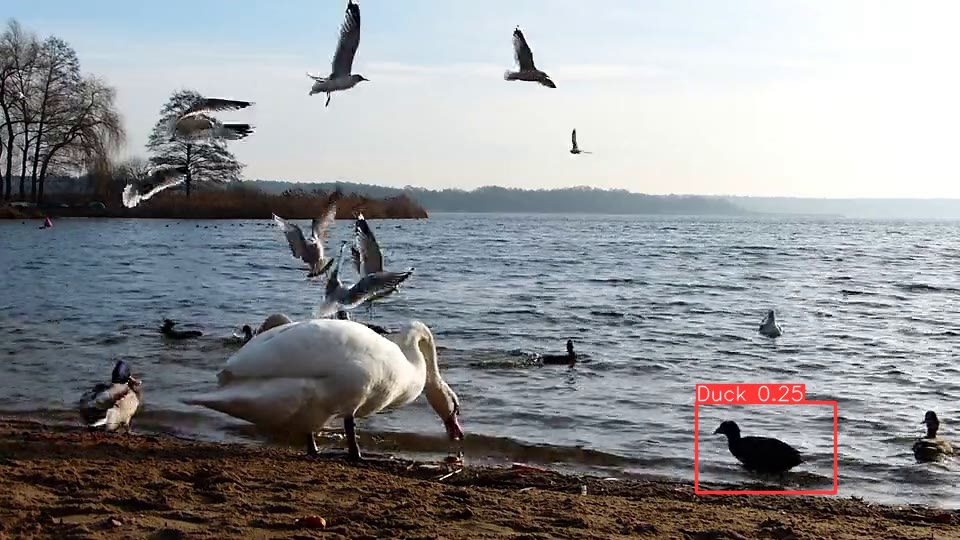

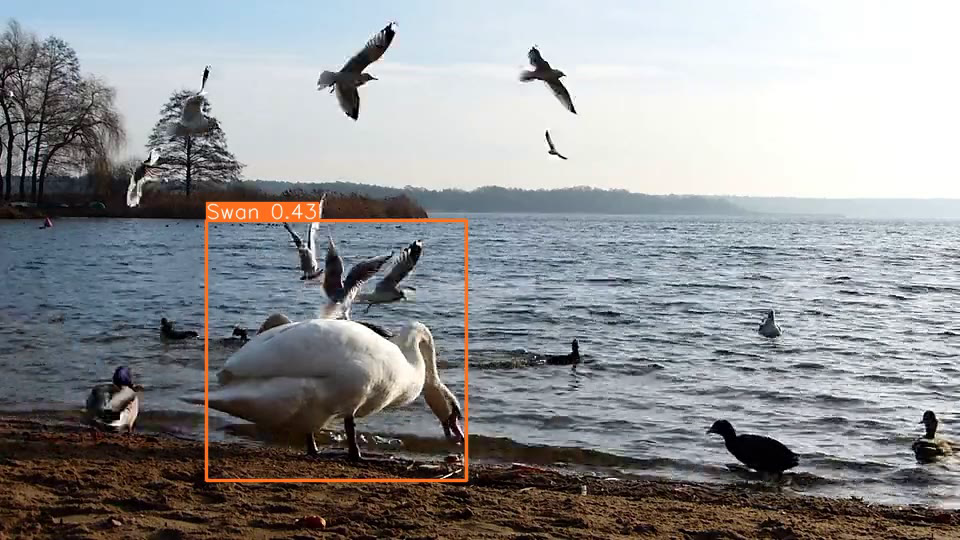

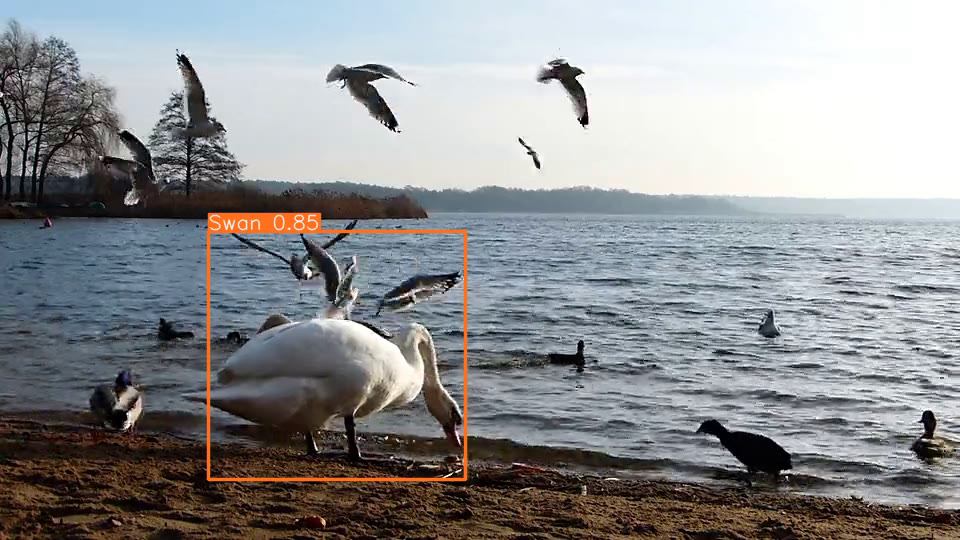

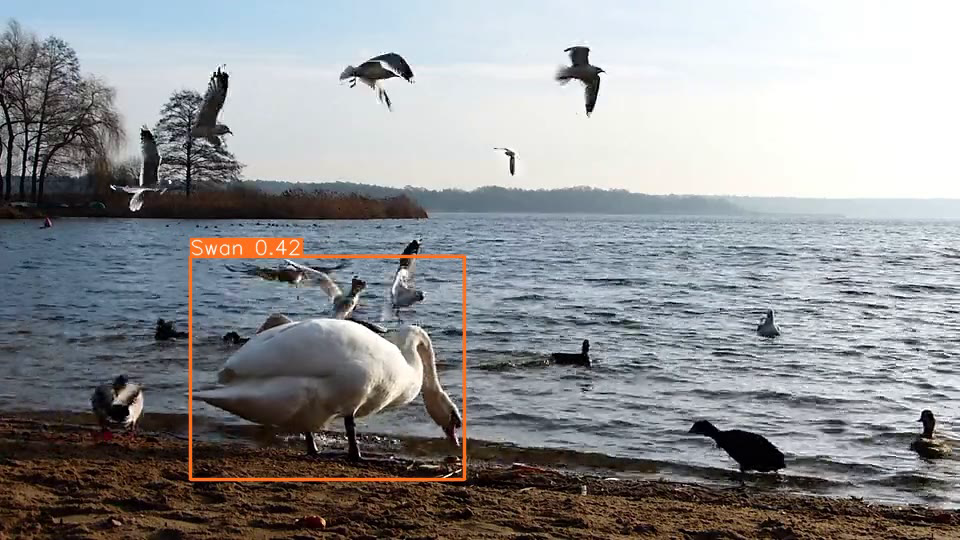

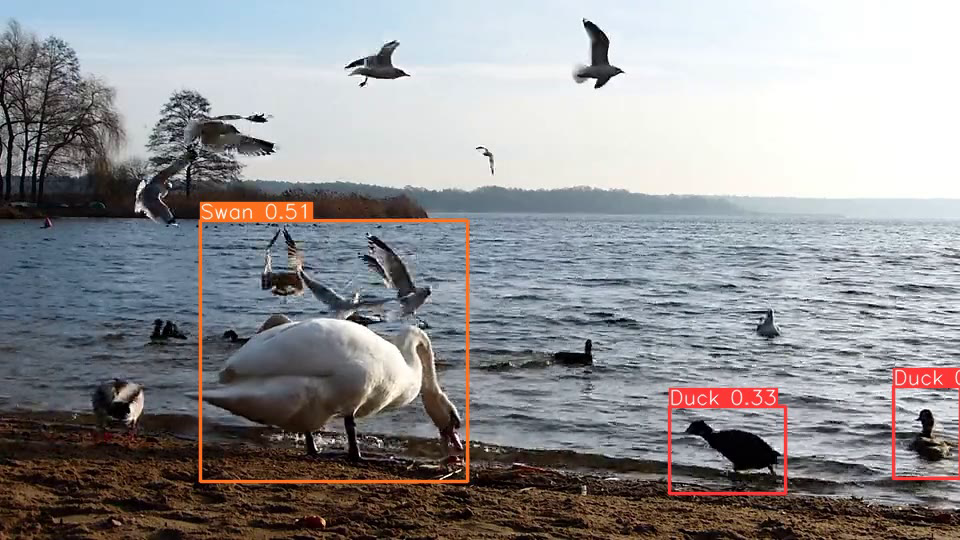

In [19]:
import cv2
from IPython.display import display, Image
import tempfile
import os

# Video dosyasını yükleyin
cap = cv2.VideoCapture('/kaggle/working/runs/detect/predict2/31264-385265648_small.avi')

# Kareleri okuyun ve gösterin
frame_count = 25  # Göstermek istediğiniz başlangıç kare sayısı
while frame_count < 35:
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_count)
    ret, frame = cap.read()
    if not ret:
        print("Kare okunamadı.")
        break
    
    # Kareyi geçici bir dosyaya kaydedin
    _, path = tempfile.mkstemp(suffix='.png')
    cv2.imwrite(path, frame)
    
    # Görseli gösterin
    display(Image(filename=path))
    
    # Geçici dosyayı silin
    os.remove(path)
    
    frame_count += 1

# Videoyu serbest bırakın
cap.release()